# Аугментация данных

In [54]:
import os
import cv2
import numpy as np
from pathlib import Path
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import random
import shutil

In [3]:
DATASET_PATH = './dataset/'

In [5]:
SPLITS = ['train', 'valid', 'test']

In [ ]:
class_names = {
    0: "Dry_joint",
    1: "Incorrect_installation",
    2: "PCB_damage",
    3: "Short_circuit"
}

# Поворот

In [56]:
ROTATIONS = {
    'rot90': cv2.ROTATE_90_CLOCKWISE,
    'rot180': cv2.ROTATE_180,
    'rot270': cv2.ROTATE_90_COUNTERCLOCKWISE
}

def rotate_polygon(points, img_w, img_h, rotation):
    points = np.array(points).reshape(-1, 2)
    rotated_coords = []
    
    for x_norm, y_norm in points:
        x_abs = x_norm * img_w
        y_abs = y_norm * img_h
        
        if rotation == cv2.ROTATE_90_CLOCKWISE:  # 90°
            new_x = img_h - y_abs
            new_y = x_abs
            new_w, new_h = img_h, img_w
        elif rotation == cv2.ROTATE_180:  # 180°
            new_x = img_w - x_abs
            new_y = img_h - y_abs
            new_w, new_h = img_w, img_h
        elif rotation == cv2.ROTATE_90_COUNTERCLOCKWISE:  # 270°
            new_x = y_abs
            new_y = img_w - x_abs 
            new_w, new_h = img_h, img_w
        else:
            new_x, new_y = x_abs, y_abs
            new_w, new_h = img_w, img_h
        
        rotated_coords.extend([new_x / new_w, new_y / new_h])
    
    return rotated_coords


def process_split(split_name):
    img_dir = Path(DATASET_PATH) / split_name / 'images'
    label_dir = Path(DATASET_PATH) / split_name / 'labels'

    aug_img_dir = Path(DATASET_PATH) / split_name / 'images_augmented'
    aug_label_dir = Path(DATASET_PATH) / split_name / 'labels_augmented'

    os.makedirs(aug_img_dir, exist_ok=True)
    os.makedirs(aug_label_dir, exist_ok=True)

    for img_file in tqdm(os.listdir(img_dir), desc=f"Processing {split_name}"):
        if not img_file.lower().endswith(('.png', '.jpg', '.jpeg')):
            continue

        base_name = img_file.rsplit('.', 1)[0]
        label_file = label_dir / f"{base_name}.txt"

        if not os.path.exists(label_file):
            print(f"Пропущено: нет аннотации для {img_file}")
            continue

        image = cv2.imread(str(img_dir / img_file))
        h, w = image.shape[:2]

        with open(label_file, 'r') as f:
            lines = f.readlines()

        for rot_name, rot_code in ROTATIONS.items():
            rotated_image = cv2.rotate(image, rot_code)
            new_filename = f"{base_name}_{rot_name}.jpg"
            cv2.imwrite(str(aug_img_dir / new_filename), rotated_image)

            new_lines = []
            for line in lines:
                data = list(map(float, line.strip().split()))
                class_id = int(data[0])
                coords = data[1:]

                rotated_coords = rotate_polygon(coords, w, h, rot_code)

                new_line = f"{class_id} {' '.join(map(str, rotated_coords))}\n"
                new_lines.append(new_line)

            with open(aug_label_dir / f"{base_name}_{rot_name}.txt", 'w') as f:
                f.writelines(new_lines)

In [57]:
for split in ['train', 'valid', 'test']:
    process_split(split)

Processing train:   0%|          | 0/128 [00:00<?, ?it/s]

Processing valid:   0%|          | 0/25 [00:00<?, ?it/s]

Processing test:   0%|          | 0/36 [00:00<?, ?it/s]

# Изменения яркости

In [ ]:
def adjust_brightness(image, factor=1.0):
    return cv2.convertScaleAbs(image, alpha=factor, beta=0)

In [ ]:
for split in SPLITS:
    img_dir = Path(DATASET_PATH) / split / 'images'
    label_dir = Path(DATASET_PATH) / split / 'labels'

    aug_img_dir = Path(DATASET_PATH) / split / 'images_augmented'
    aug_label_dir = Path(DATASET_PATH) / split / 'labels_augmented'

    os.makedirs(aug_img_dir, exist_ok=True)
    os.makedirs(aug_label_dir, exist_ok=True)

    for img_file in tqdm(os.listdir(img_dir), desc=f"Brightness processing {split}"):
        if not img_file.lower().endswith(('.png', '.jpg', '.jpeg')):
            continue

        base_name = img_file.rsplit('.', 1)[0]
        label_file = label_dir / f"{base_name}.txt"

        if not os.path.exists(label_file):
            print(f"Пропущено: нет аннотации для {img_file}")
            continue

        image = cv2.imread(str(img_dir / img_file))
        if image is None:
            print(f"Не удалось загрузить изображение: {img_file}")
            continue

        brightened = adjust_brightness(image, factor=1.5)
        brightened_path = aug_img_dir / f"{base_name}_bright.jpg"
        cv2.imwrite(str(brightened_path), brightened)

        bright_label_path = aug_label_dir / f"{base_name}_bright.txt"
        shutil.copyfile(label_file, bright_label_path)

Brightness processing train:   0%|          | 0/128 [00:00<?, ?it/s]

Brightness processing valid:   0%|          | 0/25 [00:00<?, ?it/s]

Brightness processing test:   0%|          | 0/36 [00:00<?, ?it/s]

# Масштабирование

In [ ]:
def zoom_image(image, polygon_points, zoom_factor=1.5):
    h, w = image.shape[:2]
    new_w, new_h = int(w / zoom_factor), int(h / zoom_factor)
    
    x1 = (w - new_w) // 2
    y1 = (h - new_h) // 2
    x2 = x1 + new_w
    y2 = y1 + new_h
    
    zoomed_img = image[y1:y2, x1:x2]
    zoomed_img = cv2.resize(zoomed_img, (w, h))
    
    updated_polygon = []
    for i in range(0, len(polygon_points), 2):
        x_norm, y_norm = polygon_points[i], polygon_points[i+1]
        x_abs, y_abs = x_norm * w, y_norm * h
        
        x_new = (x_abs - x1) / new_w * w
        y_new = (y_abs - y1) / new_h * h
        
        x_new = max(0.0, min(1.0, x_new / w))
        y_new = max(0.0, min(1.0, y_new / h))
        
        updated_polygon.extend([x_new, y_new])
    
    return zoomed_img, updated_polygon


In [ ]:
for split in SPLITS:
    img_dir = Path(DATASET_PATH) / split / 'images'
    label_dir = Path(DATASET_PATH) / split / 'labels'

    aug_img_dir = Path(DATASET_PATH) / split / 'images_augmented'
    aug_label_dir = Path(DATASET_PATH) / split / 'labels_augmented'

    os.makedirs(aug_img_dir, exist_ok=True)
    os.makedirs(aug_label_dir, exist_ok=True)

    for img_file in tqdm(os.listdir(img_dir), desc=f"Zoom processing {split}"):
        if not img_file.lower().endswith(('.png', '.jpg', '.jpeg')):
            continue

        base_name = img_file.rsplit('.', 1)[0]
        label_file = label_dir / f"{base_name}.txt"

        if not os.path.exists(label_file):
            print(f"Пропущено: нет аннотации для {img_file}")
            continue

        image = cv2.imread(str(img_dir / img_file))
        if image is None:
            print(f"Не удалось загрузить изображение: {img_file}")
            continue

        h, w = image.shape[:2]

        with open(label_file, 'r') as f:
            lines = f.readlines()

        zoomed_annotations = []
        zoomed_img = None

        for line in lines:
            data = list(map(float, line.strip().split()))
            class_id = int(data[0])
            coords = data[1:]

            zoomed_img, updated_coords = zoom_image(image, coords, zoom_factor=1.3)

            if zoomed_img is None or zoomed_img.size == 0:
                print(f"Пропущено: zoomed_img пустой для {base_name}")
                continue

            updated_line = f"{class_id} {' '.join(map(str, updated_coords))}\n"
            zoomed_annotations.append(updated_line)

        if len(zoomed_annotations) > 0 and zoomed_img is not None:
            zoomed_path = aug_img_dir / f"{base_name}_zoom.jpg"
            cv2.imwrite(str(zoomed_path), zoomed_img)

            zoomed_label_path = aug_label_dir / f"{base_name}_zoom.txt"
            with open(zoomed_label_path, 'w') as f:
                f.writelines(zoomed_annotations)
        else:
            print(f"Пропущено: нет валидных аннотаций после zoom для {base_name}")

Zoom processing train:   0%|          | 0/128 [00:00<?, ?it/s]

Пропущено: нет валидных аннотаций после zoom для WIN_20221017_19_11_20_Pro_jpg.rf.1c1c5510b5698d72948db896f4d309c6
Пропущено: нет валидных аннотаций после zoom для WIN_20221017_19_11_31_Pro_jpg.rf.daa5574bac566b19f89a169f35280ba8
Пропущено: нет валидных аннотаций после zoom для WIN_20221017_19_35_06_Pro_jpg.rf.b652b0ca17a6dfe7d5829df60c0ab529
Пропущено: нет валидных аннотаций после zoom для WIN_20221017_19_35_12_Pro_jpg.rf.6ca8f0458ca77c122e67933d4a5e2e74
Пропущено: нет валидных аннотаций после zoom для WIN_20221017_19_35_42_Pro_jpg.rf.9ab6da4e6e14351b0bfa0e20c840464a
Пропущено: нет валидных аннотаций после zoom для WIN_20221017_19_35_58_Pro_jpg.rf.f33a6734e0498a7e33dbe97916e19bb2
Пропущено: нет валидных аннотаций после zoom для WIN_20221017_19_37_22_Pro_jpg.rf.bd7b7a480c6cff39ee1914b946661782
Пропущено: нет валидных аннотаций после zoom для WIN_20221017_19_37_33_Pro_jpg.rf.088c58dfb9d3e773d35bc59409e27a7b
Пропущено: нет валидных аннотаций после zoom для WIN_20221017_19_38_26_Pro_jpg.r

Zoom processing valid:   0%|          | 0/25 [00:00<?, ?it/s]

Пропущено: нет валидных аннотаций после zoom для WIN_20221017_19_36_39_Pro_jpg.rf.3ae6b966b229ecac54d35844d3210e74
Пропущено: нет валидных аннотаций после zoom для WIN_20221017_19_38_23_Pro_jpg.rf.f62826fbfa2515353c38412be0604f8d
Пропущено: нет валидных аннотаций после zoom для WIN_20221023_15_35_05_Pro_jpg.rf.eef460fd27ed7cffeee8e6c17aec4355
Пропущено: нет валидных аннотаций после zoom для WIN_20221023_15_35_12_Pro_jpg.rf.a2efb1ab8f702b5101d8e7f744f4cc02
Пропущено: нет валидных аннотаций после zoom для WIN_20221102_19_57_08_Pro_jpg.rf.9bfe8f8206a23d11a807fd7dc647b259


Zoom processing test:   0%|          | 0/36 [00:00<?, ?it/s]

Пропущено: нет валидных аннотаций после zoom для WIN_20221017_18_50_50_Pro_jpg.rf.49a46cde91eb0177663e0846904408f5
Пропущено: нет валидных аннотаций после zoom для WIN_20221017_18_51_03_Pro_jpg.rf.75a0b3d591eb53271be7f7f53a0c8915
Пропущено: нет валидных аннотаций после zoom для WIN_20221017_19_34_48_Pro_jpg.rf.63f73bc04f437461aff4968ed7fb1874
Пропущено: нет валидных аннотаций после zoom для WIN_20221017_19_34_58_Pro_jpg.rf.ec9a7990188198172385beb7cf7d702c
Пропущено: нет валидных аннотаций после zoom для WIN_20221017_19_36_26_Pro_jpg.rf.82b43e8f2ee72ace4d79a46d4a8ed253
Пропущено: нет валидных аннотаций после zoom для WIN_20221017_19_36_32_Pro_jpg.rf.7ce2ed23b595f9ed924f7dd0612e1f2b
Пропущено: нет валидных аннотаций после zoom для WIN_20221017_19_38_30_Pro_jpg.rf.670c653d30e3382373054a533b17d54d
Пропущено: нет валидных аннотаций после zoom для WIN_20221023_15_32_27_Pro_jpg.rf.91d11e815652baf81caa288b8fa2de9e
Пропущено: нет валидных аннотаций после zoom для WIN_20221023_15_50_12_Pro_jpg.r

# Проверка аннотаций после аугментации

In [ ]:
color_map = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0)]

def load_yolo_segmentation(file_path, img_shape):
    h, w = img_shape[:2]
    with open(file_path, 'r') as f:
        lines = f.readlines()

    polygons = []
    class_ids = []
    for line in lines:
        data = list(map(float, line.strip().split()))
        class_id = int(data[0])
        coords = np.array(data[1:]).reshape(-1, 2)
        coords[:, 0] *= w  # x
        coords[:, 1] *= h  # y
        polygons.append(coords.astype(np.int32))
        class_ids.append(class_id)

    return polygons, class_ids


def draw_polygons(image, polygons, class_ids, color_map):
    overlay = image.copy()
    for polygon, class_id in zip(polygons, class_ids):
        color = color_map[class_id % len(color_map)]
        cv2.polylines(overlay, [polygon], isClosed=True, color=color, thickness=2)
        cv2.fillPoly(overlay, [polygon], color=color)

    result = cv2.addWeighted(overlay, 0.5, image, 0.5, 0)
    return result


def visualize_augmentations(split='train', num_samples=3):
    img_dir = Path(DATASET_PATH) / split / 'images'
    aug_img_dir = Path(DATASET_PATH) / split / 'images_augmented'
    label_dir = Path(DATASET_PATH) / split / 'labels'
    aug_label_dir = Path(DATASET_PATH) / split / 'labels_augmented'

    original_files = [f for f in os.listdir(img_dir) if f.lower().endswith(('.jpg', '.png'))]

    selected_files = random.sample(original_files, min(num_samples, len(original_files)))

    for img_file in selected_files:
        base_name = img_file.rsplit('.', 1)[0]
        ext = img_file.rsplit('.', 1)[1]

        # Оригинал
        orig_img_path = img_dir / img_file
        orig_label_path = label_dir / f"{base_name}.txt"

        orig_img = cv2.imread(str(orig_img_path))
        orig_polygons, orig_classes = load_yolo_segmentation(orig_label_path, orig_img.shape)
        orig_drawn = draw_polygons(orig_img, orig_polygons, orig_classes, color_map)

        # Повёрнутая версия
        rot_img_path = aug_img_dir / f"{base_name}_rot90.jpg"
        rot_label_path = aug_label_dir / f"{base_name}_rot90.txt"

        if os.path.exists(rot_img_path) and os.path.exists(rot_label_path):
            rot_img = cv2.imread(str(rot_img_path))
            rot_polygons, rot_classes = load_yolo_segmentation(rot_label_path, rot_img.shape)
            rot_drawn = draw_polygons(rot_img, rot_polygons, rot_classes, color_map)
        else:
            rot_drawn = np.zeros_like(orig_img)
            print(f"Нет файла поворота для {base_name}")

        # Масштабированная версия
        zoom_img_path = aug_img_dir / f"{base_name}_zoom.jpg"
        zoom_label_path = aug_label_dir / f"{base_name}_zoom.txt"

        if os.path.exists(zoom_img_path) and os.path.exists(zoom_label_path):
            zoom_img = cv2.imread(str(zoom_img_path))
            zoom_polygons, zoom_classes = load_yolo_segmentation(zoom_label_path, zoom_img.shape)
            zoom_drawn = draw_polygons(zoom_img, zoom_polygons, zoom_classes, color_map)
        else:
            zoom_drawn = np.zeros_like(orig_img)
            print(f"Нет файла зума для {base_name}")


        plt.figure(figsize=(18, 6))

        plt.subplot(1, 3, 1)
        plt.imshow(cv2.cvtColor(orig_drawn, cv2.COLOR_BGR2RGB))
        plt.title("Оригинал")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(cv2.cvtColor(rot_drawn, cv2.COLOR_BGR2RGB))
        plt.title("Поворот (rot90)")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(cv2.cvtColor(zoom_drawn, cv2.COLOR_BGR2RGB))
        plt.title("Масштабирование (zoom)")
        plt.axis('off')

        plt.suptitle(f"Файл: {base_name}.{ext}", fontsize=14)
        plt.tight_layout()
        plt.show()

train


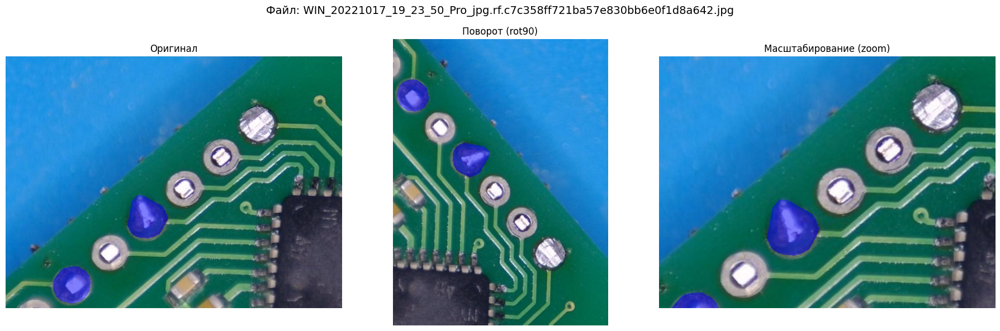

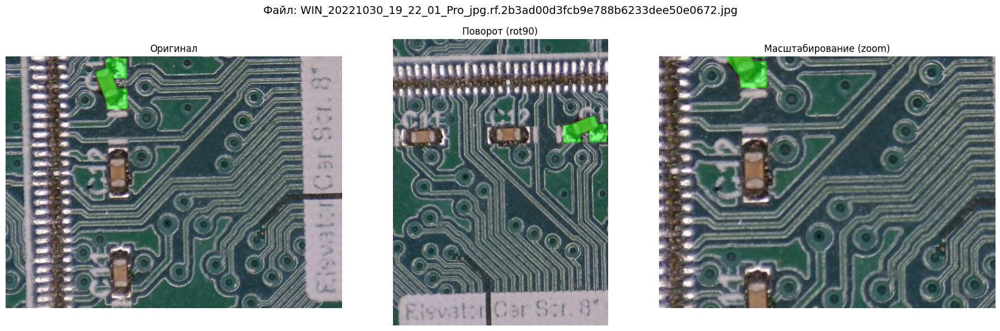

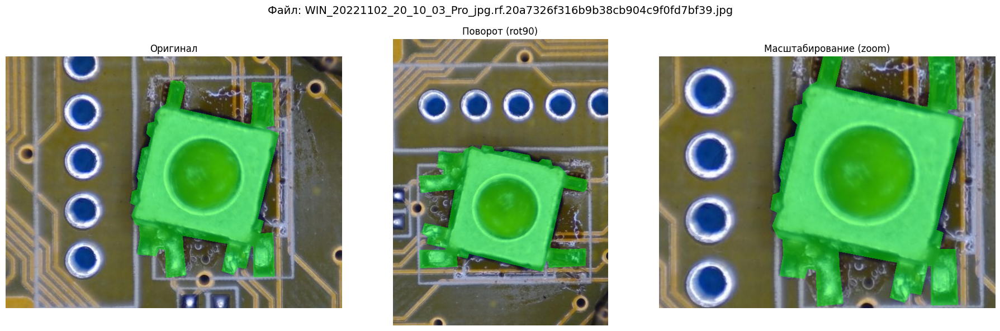

valid


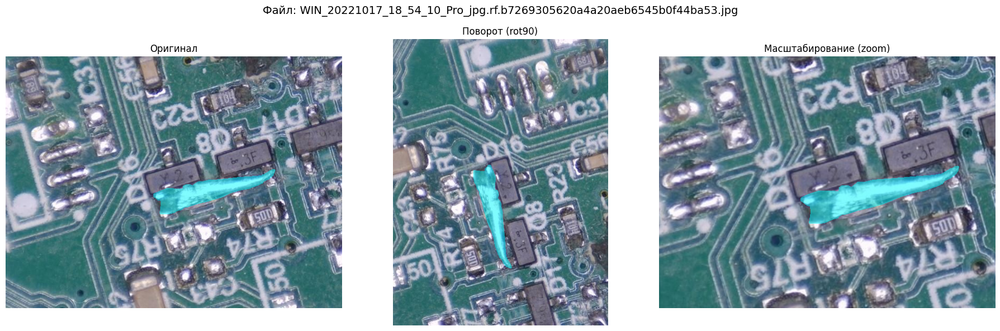

Нет файла зума для WIN_20221017_19_38_23_Pro_jpg.rf.f62826fbfa2515353c38412be0604f8d


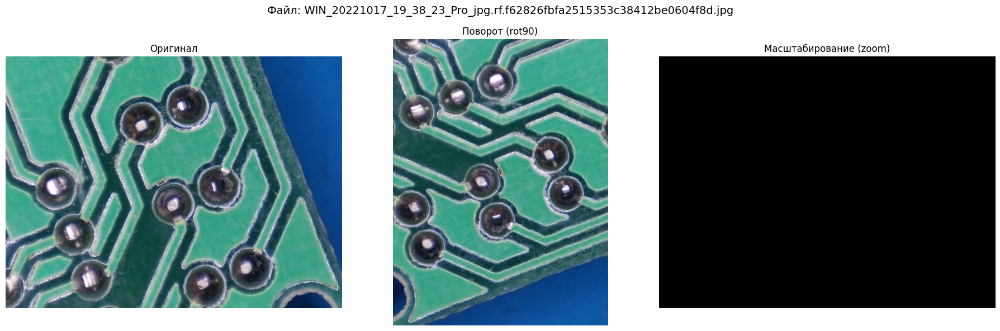

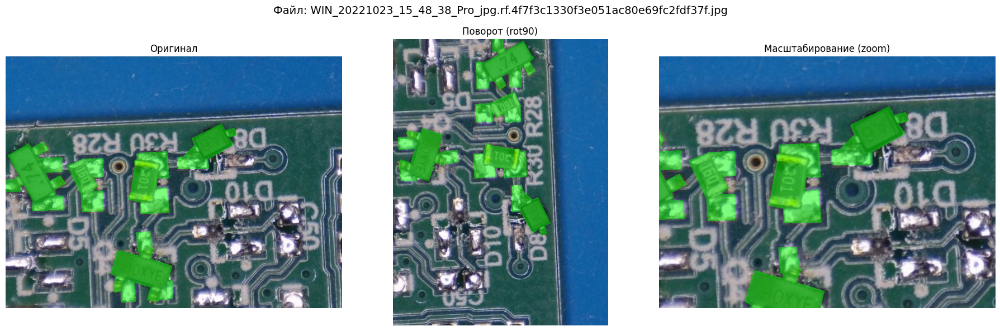

test


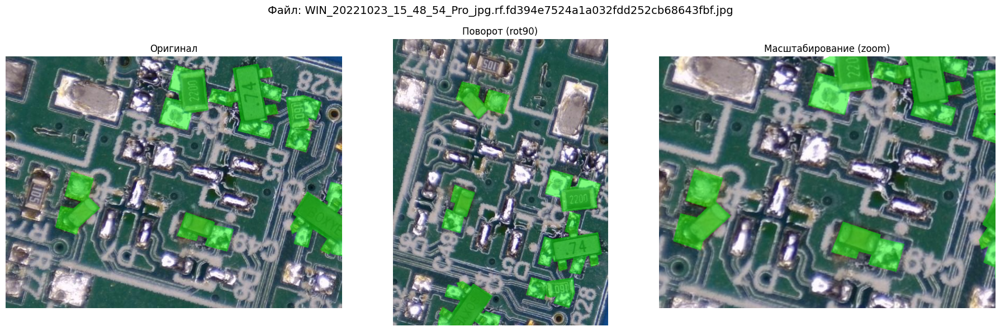

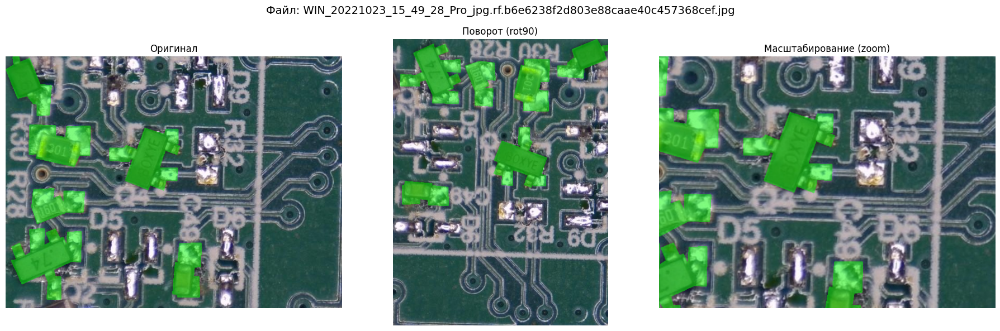

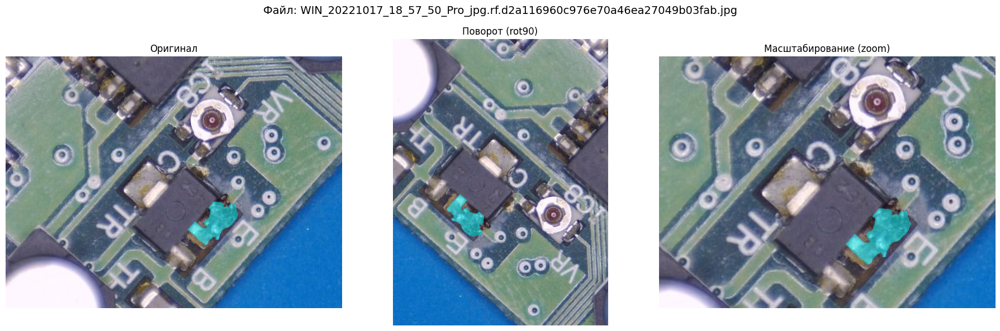

In [65]:
for _split in SPLITS:
    print(_split)
    visualize_augmentations(split=_split, num_samples=3)